# Simulacion del gas ideal

Fuente: https://github.com/rafael-fuente/Ideal-Gas-Simulation-To-Verify-Maxwell-Boltzmann-distribution

### Código de la simulación (tarda como 10 minutos)

In [ ]:
import numpy as np


class Particle:
    """Define physics of elastic collision."""
    
    def __init__(self, mass, radius, position, velocity):
        """Initialize a Particle object
        
        mass the mass of particle
        radius the radius of particle
        position the position vector of particle
        velocity the velocity vector of particle
        """
        self.mass = mass
        self.radius = radius
        
        # last position and velocity
        self.position = np.array(position)
        self.velocity = np.array(velocity)
        
        # all position and velocities recorded during the simulation
        self.solpos = [np.copy(self.position)]
        self.solvel = [np.copy(self.velocity)]
        self.solvel_mag = [np.linalg.norm(np.copy(self.velocity))]
        
    def compute_step(self, step):
        """Compute position of next step."""
        self.position += step * self.velocity
        self.solpos.append(np.copy(self.position)) 
        self.solvel.append(np.copy(self.velocity)) 
        self.solvel_mag.append(np.linalg.norm(np.copy(self.velocity))) 
        

    
    
    def check_coll(self, particle):
        """Check if there is a collision with another particle."""
        
        r1, r2 = self.radius, particle.radius
        x1, x2 = self.position, particle.position
        di = x2-x1
        norm = np.linalg.norm(di)
        if norm-(r1+r2)*1.4 < 0:
            return True
        else:
            return False

    
    def compute_coll(self, particle, step):
        """Compute velocity after collision with another particle."""
        m1, m2 = self.mass, particle.mass
        r1, r2 = self.radius, particle.radius
        v1, v2 = self.velocity, particle.velocity
        x1, x2 = self.position, particle.position
        di = x2-x1
        norm = np.linalg.norm(di)
        if norm-(r1+r2)*1.1 < step*abs(np.dot(v1-v2, di))/norm:
            self.velocity = v1 - 2. * m2/(m1+m2) * np.dot(v1-v2, di) / (np.linalg.norm(di)**2.) * di
            particle.velocity = v2 - 2. * m1/(m2+m1) * np.dot(v2-v1, (-di)) / (np.linalg.norm(di)**2.) * (-di)
            

    def compute_refl(self, step, size):
        """Compute velocity after hitting an edge.
        step the computation step
        size the medium size
        """
        r, v, x = self.radius, self.velocity, self.position
        projx = step*abs(np.dot(v,np.array([1.,0.])))
        projy = step*abs(np.dot(v,np.array([0.,1.])))
        if abs(x[0])-r < projx or abs(size-x[0])-r < projx:
            self.velocity[0] *= -1
        if abs(x[1])-r < projy or abs(size-x[1])-r < projy:
            self.velocity[1] *= -1.


def solve_step(particle_list, step, size):
    """Solve a step for every particle."""
    
    # Detect edge-hitting and collision of every particle
    for i in range(len(particle_list)):
        particle_list[i].compute_refl(step,size)
        for j in range(i+1,len(particle_list)):
                particle_list[i].compute_coll(particle_list[j],step)    

                
    # Compute position of every particle  
    for particle in particle_list:
        particle.compute_step(step)




################################################################################################################################





def init_list_random(N, radius, mass, boxsize):
    """Generate N Particle objects in a random way in a list."""
    particle_list = []

    for i in range(N):
        
#         v_mag = np.random.rand(1)*6 # CAMBIE ESTO
        v_mag = 3
#         v_ang = np.random.rand(1)*2*np.pi # CAMBIE ESTO
        v_ang = np.random.rand(1)*0.5*np.pi + np.pi
        v = np.append(v_mag*np.cos(v_ang), v_mag*np.sin(v_ang))
        
        collision = True
        while(collision == True):
            
            collision = False
#             pos = radius + np.random.rand(2)*(boxsize-2*radius) 
            pos = radius + np.random.rand(2)*(0.5*boxsize-2/2*radius) ### CAMBIE ESTA
            newparticle = Particle(mass, radius, pos, v)
            for j in range(len(particle_list)):

                collision = newparticle.check_coll( particle_list[j] )

                if collision == True:
                    break

        particle_list.append(newparticle)
    return particle_list



particle_number = 300
boxsize = 200.

# You need a larger tfin and stepnumber to get the equilibrium state. But the computation takes more time.
tfin = 130#*30
stepnumber = 2000#*30

timestep = tfin/stepnumber

particle_list = init_list_random(particle_number, radius = 1.5, mass = 1, boxsize = 200)

# Compute simulation (It takes some time if stepnumber and particle_number are large)
for i in range(stepnumber):
    print(i)
    solve_step(particle_list, timestep, boxsize)
    #print(i)


################################################################################################################################


# Visualization of the solution with matplotlib. It use a slider to change the time


# import matplotlib.pyplot as plt


# fig = plt.figure(figsize=(12, 6))
# ax = fig.add_subplot(1,2,1)

# hist = fig.add_subplot(1,2,2)

# plt.subplots_adjust(bottom=0.2,left=0.15)

# ax.axis('equal')
# ax.axis([-1, 30, -1, 30])

# ax.xaxis.set_visible(False)
# ax.yaxis.set_visible(False)
# ax.set_xlim([0,boxsize])
# ax.set_ylim([0,boxsize])

# # Draw Particles as circles
# circle = [None]*particle_number
# for i in range(particle_number):
#     circle[i] = plt.Circle((particle_list[i].solpos[0][0], particle_list[i].solpos[0][1]), particle_list[i].radius, ec="black", lw=1.5, zorder=20)
#     ax.add_patch(circle[i])

# # Graph Particles speed histogram
# vel_mod = [particle_list[i].solvel_mag[0] for i in range(len(particle_list))]
# hist.hist(vel_mod, bins= 30, density = True, label = "Simulation Data")
# hist.set_xlabel("Speed")
# hist.set_ylabel("Frecuency Density")



# Compute 2d Boltzmann distribution

#total energy should be constant for any time index
def total_Energy(particle_list, index): 
    return sum([particle_list[i].mass / 2. * particle_list[i].solvel_mag[index]**2  for i in range(len(particle_list))])


E = total_Energy(particle_list, 0)
Average_E = E/len(particle_list) 
k = 1.38064852e-23
T = 2*Average_E/(2*k)
m = particle_list[0].mass
v = np.linspace(0,10,120)
fv = m*np.exp(-m*v**2/(2*T*k))/(2*np.pi*T*k)*2*np.pi*v
# hist.plot(v,fv, label = "Maxwell–Boltzmann distribution") 
# hist.legend(loc ="upper right")


# from matplotlib.widgets import Slider

# slider_ax = plt.axes([0.1, 0.05, 0.8, 0.05])
# slider = Slider(slider_ax,      # the axes object containing the slider
#                   't',            # the name of the slider parameter
#                   0,          # minimal value of the parameter
#                   tfin,          # maximal value of the parameter
#                   valinit=0,  # initial value of the parameter 
#                   color = '#5c05ff' 
#                  )

# def update(time):
#     i = int(np.rint(time/timestep))
    
#     #ax.set_title('Energy =' + str(Energy[i]))
    
#     # Draw Particles as circles
#     for j in range(particle_number):
#         circle[j].center = particle_list[j].solpos[i][0], particle_list[j].solpos[i][1]
#     hist.clear()    
    
#     # Graph Particles speed histogram
#     vel_mod = [particle_list[j].solvel_mag[i] for j in range(len(particle_list))]
#     hist.hist(vel_mod, bins= 30, density = True, label = "Simulation Data")
#     hist.set_xlabel("Speed")
#     hist.set_ylabel("Frecuency Density")
    
#     # Compute 2d Boltzmann distribution
#     E = total_Energy(particle_list, i)
#     Average_E = E/len(particle_list) 
#     k = 1.38064852e-23
#     T = 2*Average_E/(2*k)
#     m = particle_list[0].mass
#     v = np.linspace(0,10,120)
#     fv = m*np.exp(-m*v**2/(2*T*k))/(2*np.pi*T*k)*2*np.pi*v
#     hist.plot(v,fv, label = "Maxwell–Boltzmann distribution") 
#     hist.legend(loc ="upper right")
    
# slider.on_changed(update)
# plt.show()

### Posiciones x

In [23]:
pos_x_list = [particle_list[j].solpos[0][0] for j in range(len(particle_list))]

pos_x_list = np.array(pos_x_list)

pos_x_list.shape

(300,)

In [24]:
pos_x_hist = np.histogram(pos_x_list, bins=10, range=None)

pos_x_hist

(array([36, 27, 25, 28, 36, 28, 26, 31, 27, 36]),
 array([ 1.5450174 , 11.38373108, 21.22244476, 31.06115845, 40.89987213,
        50.73858581, 60.57729949, 70.41601317, 80.25472685, 90.09344054,
        99.93215422]))

In [25]:
entropy_x = np.sum( pos_x_hist[0]*np.log(pos_x_hist[0]) )
entropy_x

1023.2346976366081

### Posiciones y

In [26]:
pos_y_list = [particle_list[j].solpos[0][1] for j in range(len(particle_list))]

In [27]:
pos_y_hist = np.histogram(pos_y_list, bins=10, range=None)

pos_y_hist

(array([37, 29, 24, 28, 31, 31, 30, 26, 33, 31]),
 array([ 1.64801777, 11.45382488, 21.259632  , 31.06543912, 40.87124623,
        50.67705335, 60.48286047, 70.28866758, 80.0944747 , 89.90028182,
        99.70608893]))

In [28]:
entropy_y = np.sum( pos_y_hist[0]*np.log(pos_y_hist[0]) )
entropy_y

1022.3225510346361

In [52]:
particle_list[0].solpos[0:5]

[array([11.274827  , 83.31879714]),
 array([11.10109659, 83.23023788]),
 array([10.92736617, 83.14167862]),
 array([10.75363576, 83.05311935]),
 array([10.57990534, 82.96456009])]

In [31]:
pos_y_hist[0]

array([37, 29, 24, 28, 31, 31, 30, 26, 33, 31])

In [32]:
entropies_y = []

for k in range(len(particle_list[0].solpos)):
    pos_y_list = [particle_list[j].solpos[k][1] for j in range(len(particle_list))]
    pos_y_hist = np.histogram(pos_y_list, bins=50, range=(0,200))
    entropy_y = -np.sum( pos_y_hist[0]*np.log(pos_y_hist[0]+1) )
#     entropy_y = -np.sum( np.log(pos_y_hist[0]**pos_y_hist[0]) )
    entropies_y.append(entropy_y)

entropies_y = np.array(entropies_y)
entropies_y[0:5]
#     print(entropy_y)

array([-776.14128651, -777.32283156, -776.76383835, -776.57980253,
       -776.38504003])

### Entropia

Asumiendo probabilidades independientes para $x$, $y$, $p_x$ y $p_y$

$ p = p_x \ p_y \ p_{px} \ p_{py} $

$ S = -p \ln{p} \\
 S = -p_x \ln{p_x}-p_y \ln{p_y}-p_{px} \ln{p_{px}}-p_{py} \ln{p_{py}} $

$ S = S_x + S_y + S_{px} + S_{py} $

#### Entropia de $y$

$ S_y = -p_y \ln{p_y} $

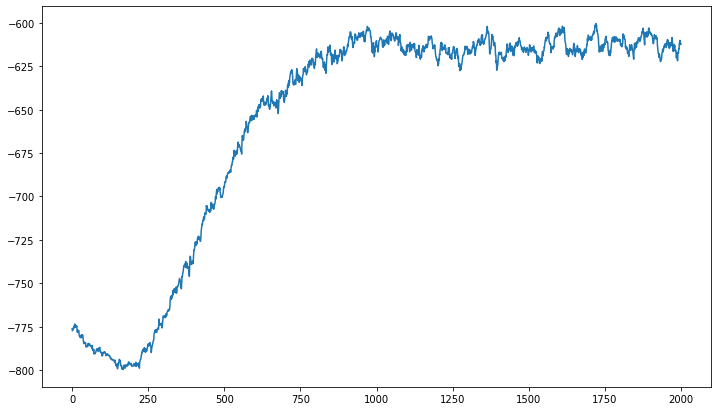

In [55]:
plt.figure(figsize=(12,7))
plt.plot(entropies_y)

In [34]:
entropies_x = []

for k in range(len(particle_list[0].solpos)):
    pos_x_list = [particle_list[j].solpos[k][0] for j in range(len(particle_list))]
    pos_x_hist = np.histogram(pos_x_list, bins=50, range=(0,200))
    entropy_x = -np.sum( pos_x_hist[0]*np.log(pos_x_hist[0]+1) )
#     entropy_x = -np.sum( np.log(pos_x_hist[0]**pos_x_hist[0]) )
    entropies_x.append(entropy_x)

entropies_x = np.array(entropies_x)
entropies_x[0:5]
#     print(entropy_y)

array([-772.5424401 , -772.22401752, -773.32299829, -773.17725408,
       -772.61153761])

In [62]:
# plt.figure(figsize=(12,7))
# plt.plot(entropies_x)

In [61]:
# plt.figure(figsize=(12,7))
# plt.plot(entropies_x, entropies_y)

### Entropia posicion

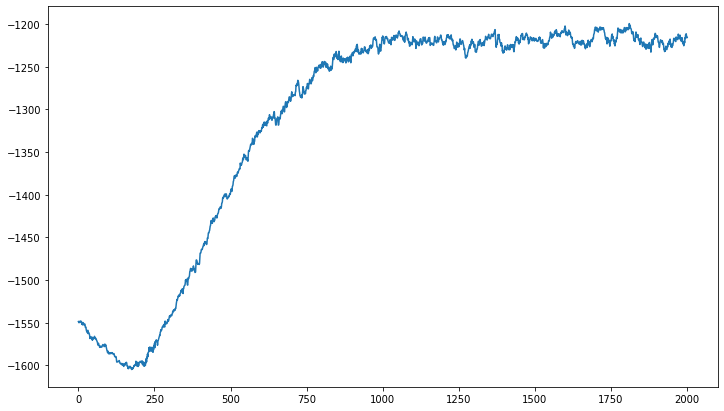

In [58]:
plt.figure(figsize=(12,7))
plt.plot(entropies_x + entropies_y)

In [38]:
vel_x_list = [particle_list[j].solvel[15][0] for j in range(len(particle_list))]
vel_x_list[0:5]

[-2.6727756063889205,
 -1.867853846575191,
 -1.7728784576290662,
 -2.9653351172118225,
 -2.982865902808966]

In [39]:
vel_x_hist = np.histogram(vel_x_list, bins=10, range=(0,10))
vel_x_hist

(array([5, 5, 7, 0, 0, 0, 0, 0, 0, 0]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]))

In [40]:
entropies_vx = []

for k in range(len(particle_list[0].solpos)):
    vel_x_list = [particle_list[j].solvel[k][0] for j in range(len(particle_list))]
    vel_x_hist = np.histogram(vel_x_list, bins=50, range=(-5,5))
    entropy_vx = -np.sum( vel_x_hist[0]*np.log(vel_x_hist[0]+0.01) )
    entropies_vx.append(entropy_vx)
    
#     vel_mod = [particle_list[j].solvel_mag[i] for j in range(len(particle_list))]

#     vel_hist = np.histogram(vel_mod, bins=10, range=None, normed=None, weights=None, density=True)
    
entropies_vx = np.array(entropies_vx)
entropies_vx[0:5]
#     print(entropy_y)

array([-962.05608072, -958.14838194, -958.14838194, -958.14838194,
       -944.25461567])

In [41]:
entropies_vy = []

for k in range(len(particle_list[0].solpos)):
    vel_y_list = [particle_list[j].solvel[k][1] for j in range(len(particle_list))]
    vel_y_hist = np.histogram(vel_y_list, bins=50, range=(-5,5))
    entropy_vy = -np.sum( vel_y_hist[0]*np.log(vel_y_hist[0]+0.01) )
    entropies_vy.append(entropy_vy)
    
#     vel_mod = [particle_list[j].solvel_mag[i] for j in range(len(particle_list))]

#     vel_hist = np.histogram(vel_mod, bins=10, range=None, normed=None, weights=None, density=True)
    
entropies_vy = np.array(entropies_vy)
entropies_vy[0:5]
#     print(entropy_y)

array([-937.30635894, -937.30635894, -937.30635894, -932.28208167,
       -932.28208167])

In [42]:
 entropies_vy

array([-937.30635894, -937.30635894, -937.30635894, ..., -602.93158629,
       -610.86101268, -606.53632224])

In [43]:
np.histogram(vel_y_list, bins=10)

(array([ 9, 11, 34, 51, 73, 67, 35, 16,  2,  2]),
 array([-5.94319067, -4.68727709, -3.4313635 , -2.17544992, -0.91953634,
         0.33637724,  1.59229083,  2.84820441,  4.10411799,  5.36003157,
         6.61594516]))

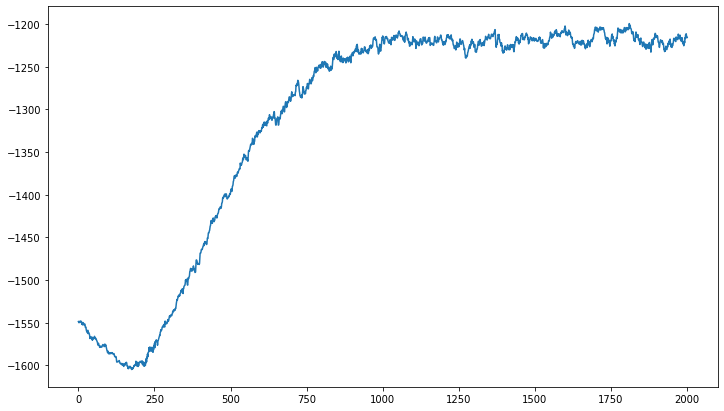

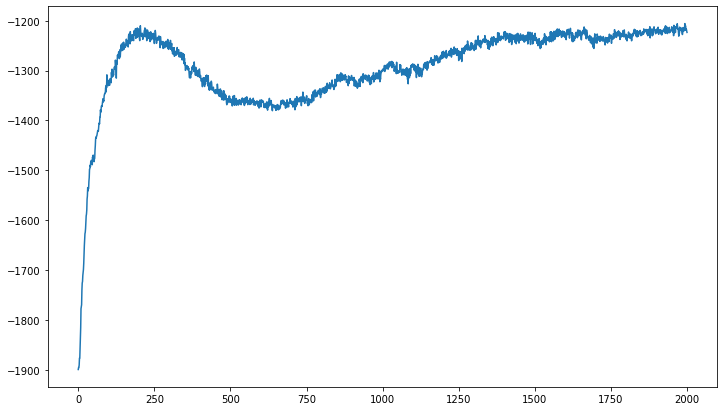

In [59]:
Entropia_r = entropies_x + entropies_y #+ entropies_vx + entropies_vy
Entropia_v = entropies_vx + entropies_vy

plt.figure(figsize=(12,7))
plt.plot(Entropia_r)
plt.show()

plt.figure(figsize=(12,7))
plt.plot(Entropia_v)
plt.show()

Entropia = Entropia_r + Entropia_v

### Entropia

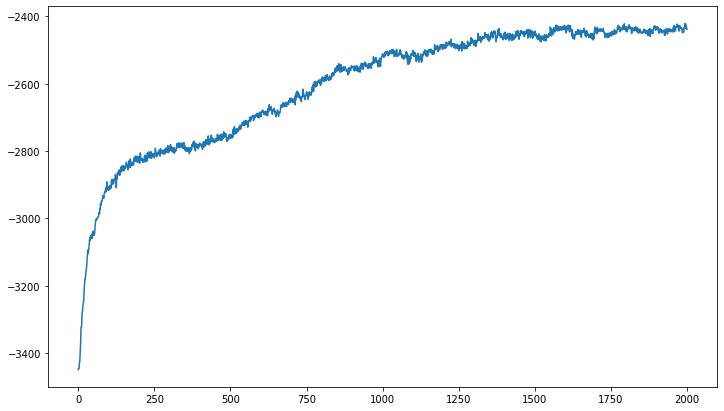

In [60]:
plt.figure(figsize=(12,7))

plt.plot(Entropia)
plt.show()

### Figura para el video

In [ ]:
# for k in range(stepnumber):
# for k in range(0, stepnumber, 50):

k = 1#stepnumber

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(2,2,1)

# hist = fig.add_subplot(1,2,2)

plt.subplots_adjust(bottom=0.2,left=0.15)

ax.axis('equal')
ax.axis([-1, 30, -1, 30])

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_xlim([0,boxsize])
ax.set_ylim([0,boxsize])

# Draw Particles as circles
circle = [None]*particle_number
for i in range(particle_number):
    circle[i] = plt.Circle((particle_list[i].solpos[k][0], particle_list[i].solpos[k][1]), particle_list[i].radius, ec="black", lw=1.5, zorder=20)
    ax.add_patch(circle[i])

vel_y_list = [particle_list[j].solvel[k][1] for j in range(len(particle_list))]    
vel_x_list = [particle_list[j].solvel[k][0] for j in range(len(particle_list))]
pos_y_list = [particle_list[j].solpos[k][1] for j in range(len(particle_list))]
pos_x_list = [particle_list[j].solpos[k][0] for j in range(len(particle_list))]

pos_partic_j = np.array(particle_list[31].solpos)

plt.plot(pos_partic_j.T[0], pos_partic_j.T[1])

pos_partic_j = np.array(particle_list[75].solpos)

plt.plot(pos_partic_j.T[0], pos_partic_j.T[1])

pos_partic_j = np.array(particle_list[42].solpos)

plt.plot(pos_partic_j.T[0], pos_partic_j.T[1])

ax.quiver(pos_x_list, pos_y_list, vel_x_list, vel_y_list, color='orange')

hist = fig.add_subplot(2,2,2)

vel_mod = [particle_list[j].solvel_mag[k] for j in range(len(particle_list))]
hist.hist(vel_mod, bins= 30, density = True, label = "Simulation Data")
hist.set_xlabel("Speed")
hist.set_ylabel("Frecuency Density")

# Compute 2d Boltzmann distribution
E = total_Energy(particle_list, k)
Average_E = E/len(particle_list) 
kb = 1.38064852e-23
T = 2*Average_E/(2*kb)
m = particle_list[0].mass
v = np.linspace(0,10,120)
fv = m*np.exp(-m*v**2/(2*T*kb))/(2*np.pi*T*kb)*2*np.pi*v
hist.plot(v,fv, label = "Maxwell–Boltzmann distribution") 
hist.legend(loc ="upper right")

hist_x = fig.add_subplot(2,2,3)

pos_x_list = [particle_list[j].solpos[k][0] for j in range(len(particle_list))]

hist_x.hist(pos_x_list, bins= 50, range=(0,200), density = True, label = "Simulation Data")

hist_y = fig.add_subplot(2,2,4)

pos_y_list = [particle_list[j].solpos[k][1] for j in range(len(particle_list))]

hist_y.hist(pos_y_list, bins= 50, range=(0,200), density = True, label = "Simulation Data")

# plt.quiver(x_pos, y_pos, final_vector[0], final_vector[1], scale=1e9, units="xy")


### Hago las imagenes para el video (esto tarda como 10 minutos)

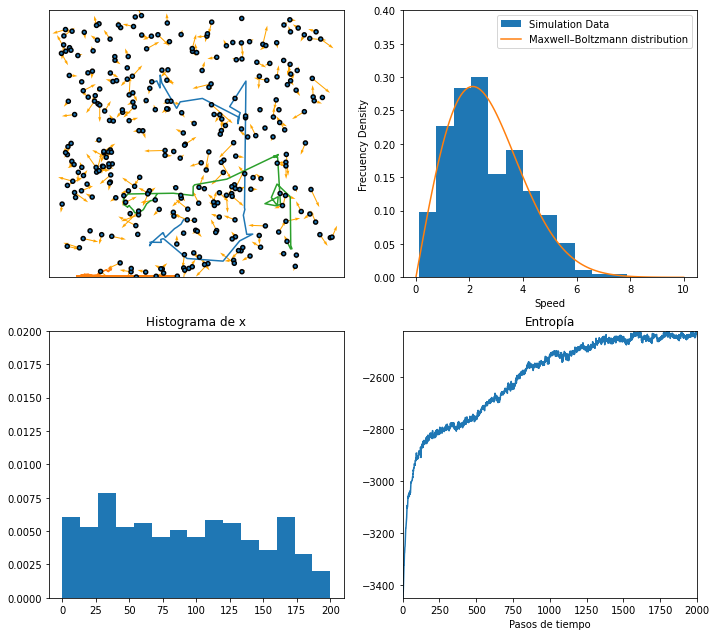

In [63]:
fig, ax = plt.subplots(figsize=(12, 12))

for k in range(0, stepnumber, 5): #stepnumber
    
    ax.clear()
    plt.clf()
    # plotting line
#     ax.plot(x, np.sinc(x**2) + np.sin(x + 2 * np.pi / duration * t), lw = 3)
#     ax.set_ylim(-1.5, 2.5)

    # returning numpy image
#     return mplfig_to_npimage(fig)


    # hist = fig.add_subplot(1,2,2)

    # plt.subplots_adjust(bottom=0.2,left=0.15)

    
    ax = fig.add_subplot(2,2,1)

    # hist = fig.add_subplot(1,2,2)

    plt.subplots_adjust(bottom=0.2,left=0.15)

    ax.axis('equal')
    ax.axis([-1, 30, -1, 30])

    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.set_xlim([0,boxsize])
    ax.set_ylim([0,boxsize])

    # Draw Particles as circles
    circle = [None]*particle_number
    for i in range(particle_number):
        circle[i] = plt.Circle((particle_list[i].solpos[k][0], particle_list[i].solpos[k][1]), particle_list[i].radius, ec="black", lw=1.5, zorder=20)
        ax.add_patch(circle[i])

    vel_y_list = [particle_list[j].solvel[k][1] for j in range(len(particle_list))]    
    vel_x_list = [particle_list[j].solvel[k][0] for j in range(len(particle_list))]
    pos_y_list = [particle_list[j].solpos[k][1] for j in range(len(particle_list))]
    pos_x_list = [particle_list[j].solpos[k][0] for j in range(len(particle_list))]

    pos_partic_j = np.array(particle_list[31].solpos)

    plt.plot(pos_partic_j.T[0][:k], pos_partic_j.T[1][:k])

    pos_partic_j = np.array(particle_list[75].solpos)

    plt.plot(pos_partic_j.T[0][:k], pos_partic_j.T[1][:k])

    pos_partic_j = np.array(particle_list[42].solpos)

    plt.plot(pos_partic_j.T[0][:k], pos_partic_j.T[1][:k])

    ax.quiver(pos_x_list, pos_y_list, vel_x_list, vel_y_list, color='orange')

    hist = fig.add_subplot(2,2,2)

    vel_mod = [particle_list[j].solvel_mag[k] for j in range(len(particle_list))]
    hist.hist(vel_mod, bins= 12, density = True, label = "Simulation Data")
    hist.set_xlabel("Speed")
    hist.set_ylabel("Frecuency Density")

    # Compute 2d Boltzmann distribution
    E = total_Energy(particle_list, k)
    Average_E = E/len(particle_list) 
    kb = 1.38064852e-23
    T = 2*Average_E/(2*kb)
    m = particle_list[0].mass
    v = np.linspace(0,10,120)
    fv = m*np.exp(-m*v**2/(2*T*kb))/(2*np.pi*T*kb)*2*np.pi*v
    hist.plot(v,fv, label = "Maxwell–Boltzmann distribution") 
    hist.legend(loc ="upper right")
    
    plt.ylim([0, 0.4])

    
    hist_x = fig.add_subplot(2,2,3)

    pos_x_list = [particle_list[j].solpos[k][0] for j in range(len(particle_list))]

    hist_x.hist(pos_x_list, bins= 15, range=(0,200), density = True, label = "Simulation Data")
    
    plt.title('Histograma de x')
    
    plt.ylim([0, 0.02])

#     hist_y = fig.add_subplot(2,2,4)

#     pos_y_list = [particle_list[j].solpos[k][1] for j in range(len(particle_list))]

#     hist_y.hist(pos_y_list, bins= 20, range=(0,200), density = True, label = "Simulation Data")

#     plt.ylim([0, 0.02])

    entrop_plot = fig.add_subplot(2,2,4)

    entrop_plot.plot(Entropia[:k])
    
    plt.title('Entropía')
    
    plt.ylim([Entropia.min(), Entropia.max()])
    
    plt.xlim([0, stepnumber])
    
    plt.xlabel('Pasos de tiempo')
    
    plt.savefig(f'gas_t_{k}.png', dpi=100)

In [48]:
!pip install moviepy

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


### Junto las imagenes en el video

In [64]:
from moviepy.editor import ImageSequenceClip

clip = ImageSequenceClip([f'gas_t_{k}.png' for k in range(0, stepnumber, 5)], fps=20) #stepnumber

clip.ipython_display(fps = 20, loop = True, width=720)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


<!-- ### 40. El gas perfecto no en equilibrio  


<div style="text-align: justify">
    La distribución de Boltzmann se puede deducir también siguiendo un método totalmente distinto a partir directamente de la condición de que la entropía de un gas como un todo, considerado como sistema aislado, debe ser máxima. Esta demostración posee de por sí un interés fundamental, ya que se basa en un método que hace posible calcular la entropía de un gas que se encuentra en un estado arbitrario macroscópico que no es de equilibrio. 
</div>    

  
  
<div style="text-align: justify">
Todo estado macroscópico de un gas perfecto se puede caracterizar de la siguiente manera. Distribuyamos todos los estados cuánticos de una partícula individual del gas en grupos, cada uno de los cuales está formado por estados próximos entre sí (en particular, con energías próximas), siendo en todo caso muy grande tanto el número de estados en cada grupo como también el número de partículas que se encuentran en ellos. Numeremos estos grupos de estados mediante el índice j =1, 2, ..., y sea $ G_j $ el número de estados en el j-ésimo grupo y $ N_j $ el número de partículas en estos estados. El conjunto de números Nj caracterizará entonces por completo el estado macroscópico del gas.
</div>    

<div style="text-align: justify">
El problema de calcular la entropía del gas se reduce al problema de determinar el peso estadístico $ \Delta \Gamma $ del estado macroscópico dado, es decir, el número de maneras microscópicas que permiten realizar este estado. Considerando cada grupo de Nj partículas como un sistema independiente y designando por $ \Delta \Gamma_j $ su peso estadístico, podemos escribir:
</div>


<div style="text-align: center"> $ \Delta \Gamma = \prod_j \Delta \Gamma_j \ (40.1)$ </div>



De esta manera, el problema queda reducido al cálculo de $\Delta \Gamma$.

En la estadística de Boltzmann los números de ocupación medios de todos los
estados cuánticos son pequeños comparados con la unidad. Esto significa que los
números Nj de partículas deben ser pequeños respecto de los números G; de estados
(NW; < G;), aunque, naturalmente, en cualquier caso sean de suyo muy grandes.
Conforme se explicó en el $ 37, el hecho de que los números medios de ocupación
sean pequeños permite suponer que todas las partículas se distribuyen entre los
diferentes estados con total independencia unas de otras. Colocando cada una de
las N; partículas en uno de Jos G;, estados, obtenemos en total Gi" distribuciones
posibles, entre las que, sin embargo, las hay idénticas, ya que algunas difieren sola-
mente en una permutación de las partículas entre sí (todas las partículas son idén-
ticas). El número de permutaciones de N; partículas es N;!, y así el peso estadístico
de la distribución de N; partículas en Gj estados es igual a .

any
j Ni (40.2)
La entropía del gas se calcula como logaritmo de su peso estadístico
El gas perfecto no en equilibrio 137
Substituyendo (40.2), tenemos:
S = 2 (N; In Gj— In Ny).
Teniendo presente que los números N; son grandes, utilicemos para In N;! la fór-
. EN;
mula aproximada In N;! = N; In (4) * y obtendremos:
e
eG
S= > Ny In 2, (40.3)
N;
3
Esta fórmula resuelve el problema planteado, ya que determina la entropía
de un gas perfecto que se encuentra en un estado macroscópico arbitrario fijado
por el conjunto de números N;,. Escribámosla introduciendo los números medios
ñ, de partículas en cada uno de los estados cuánticos del j-ésimo grupo:
Entonces
e
S= > Gñy In —. (40.5)
nj
j
Si el movimiento de las partículas es cuasiclásico, en esta fórmula se puede
pasar a la distribución de las partículas en el espacio de las fases. Dividamos el
espacio de las fases de una partícula en celdas Ap“ Ag) cada una de las cuales
es pequeña, pero aun así contiene un número grande de partículas. El número de
estados cuánticos « correspondientes » a estas celdas es igual a
ApDAgD
G; = 227” aw (40.6)
(hy
(r es el número de grados de libertad de una partícula) y escribiremos el número
de partículas en estos estados en la forma N;= n(p, q) Ar, donde n(p, q) es la
densidad de distribución de las partículas en el espacio de las fases. Substituyamos
estas expresiones en (40.5) y, luego, teniendo en cuenta que las celdas ArÚ? son
* Para N grande, la suma In N! = In 14In 2+...-+In N se puede substituir aproximadamente por
la integral
N
N
f In x de =N In
e
0
138 El gas perfecto
pequeñas y que su número es grande, reemplacemos la suma respecto de j por una
integración en todo el espacio de las fases de una partícula:
e
S= j mInó dr, (40.7)
n
En el estado de equilibrio la entropía debe tener un valor máximo (aplicada a un
gas perfecto, esta proposición se llama a veces teorema H de Boltzmann). Veamos
cómo se puede hallar, partiendo de esta condición, la función distribución de las
partículas del gas en un estado de equilibrio estadístico. El problema consiste en
hallar los valores n; para los que la suma (40.5) presenta un máximo que sea posible
cumpliéndose las condiciones adicionales
EN ¡= 2 Gjñj = N
2 eN; = 2 Giñ; =E,
que expresan la constancia del número total de partículas N y de la energía total E
del gas. Siguiendo el conocido método de los factores indeterminados de Lagrange,
hay que igualar a cero las derivadas
0
—Í S+aN+BE) =0, (40.8)
Oñ;
donde «a, f son ciertas constantes. Efectuando la derivación, se encuentra:
Gi(— Infiy+a+Be)) =0,
de donde In 1; = a«+Bej, o bien
ñj = e %+Be,,
Ésta no es sino la distribución de Boltzmann que ya conocemos; las constantes
a y f están ligadas con T y u por las relaciones 4 = u/T, B = —1/T *.
* Estos valores de q y $ podían haberse previsto ya: las ecuaciones (40.8) se pueden escribir en forma
de relación entre diferenciales
dS+a dN+B dE =0,
relación que debe coincidir con la diferencial de la energía interna (para un volumen dado) dE= TdS+udN.
Energía libre de un gas perfecto de Boltzmann 139
$41. Energía libre de un gas perfecto de Boltzmann

Apliquemos la fórmula general (31.3)

F=-—T In Y e-En/7 (41.1)
n
al cálculo de la energía libre de un gas perfecto que obedece a la estadística de Boltz-
mann.

Escribiendo la energía E, como suma de energías e, podemos reducir la suma
respecto de todos los estados del gas a una suma con relación a todos los estados
de una molécula individual. Cada estado del gas se determinará por un sistema de
N valores e, (N es el número de moléculas del gas) que, en el caso de Boltzmann,
se pueden considerar todos distintos entre sí (en cada estado molecular no hay más
de una molécula). Excribiendo e—F»/7 en forma de producto de los factores e—'x/T
para cada una de las moléculas y sumando independientemente respecto de todos
los estados de cada una, obtendríamos la expresión

( E eUlTIN, (41.2)
El conjunto de posibles valores e, es el mismo para todas las molécúlas del gas,
y por ello son también las mismas las sumas Y e-*/7 |

Sin embargo, es necesario no perder de vista el siguiente hecho. Todos los sis-
temas de N valores e, distintos que difieren tan sólo en la distribución de las molécu-
las idénticas del gas entre los niveles ez, corresponden a un mismo estado cuántico
del gas. En la suma estadísticas de la fórmula (41.1), en cambio, cada uno de los
estados debe tenerse en cuenta tan sólo una vez *. Por consiguiente, hay que divi-
dir todavía la expresión (41.2) por el número de las posibles permutaciones de N
moléculas entre sí, es decir, por N! **. De esta manera,

1 N
> eEnlT = — ( > A) (41.3)
n Ni k
Substituyendo esta expresión en (41.1), obtenemos:
F =-NT In PenlT4T In N!
Dado que N es un número muy grande, para In N! se puede utilizar la fórmula
N
In Niz N In —
e
* Cf. la nota en la pág.10S.
** Es importante el hecho de que en la estadística de Boltzmann es relativamente pequeño el papel
que representan los términos que en (41.2) contienen los mismos valores Ek.
140 El gas perfecto
(véase la nota en la pág. 135). Como resultado se obtiene la siguiente fórmula:
e
F=-=NT In] — -eg/T
N [530 .. ), (41.4)
k
que permite calcular la energía libre de cualquier gas constituido por moléculas
idénticas y que obecece a la estadística de Boltzmann.
En la estadística clásica la fórmula (41.4) debe escribirse en la forma
E=-=NT no femor dr, (41.5)
n
donde la integración se efectúa en el espacio de las fases de una molécula, y dr
se ha definido en (38.1).
$42. La ecuación de estado de un gas perfecto
En el $ 38 se hizo ya notar que el movimiento de translación de las moléculas
de un gas es siempre cuasiclásico, pudiéndose escribir la energía de una molécula
en la forma
perprp?
barr P) = ——— 4 (42.1)
2m
donde el primer término es su energía cinética de translación y por £”, se han desig-
nado los niveles de energía que corresponden a la rotación de la molécula y a su
estado interno; e', no depende ni de las velocidades ni de las coordenadas del centro
de masas de la molécula (suponemos que no existe ningún campo exterior).
La suma estadística que sigue al símbolo de logaritmo en la fórmula (41.4) hay
que substituirla ahora por la expresión
1 e
1 3 2 2
A dl J j j e zmT Ps *P 12 dz dpydpa dV
(2rhi)3
k po
m TN3n ym
=V| — es IT, 42.2
(hr) 2007 2
k
(la integración respecto de x, y, z se extiende a todo el volumen del gas, V). Para la
energía libre obtenemos:
eV y mTN3/
F=-NTIn| —( —— -x 17 42.3
(FE) 2 ] (42.3)

 -->